Populating the interactive namespace from numpy and matplotlib


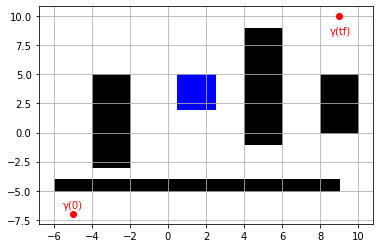

In [7]:
%pylab inline
import matplotlib.pyplot as plt

def draw_environment():
    fig = plt.figure()
    ax = plt.subplot(111)

    rect1 = matplotlib.patches.Rectangle((4,-1), 2, 10, color='black')
    rect2 = matplotlib.patches.Rectangle((-6,-5), 15, 1, color='black')
    rect3 = matplotlib.patches.Rectangle((8,0), 2, 5, color='black')
    rect4 = matplotlib.patches.Rectangle((-4,-3), 2, 8, color='black')
    blue_rect = matplotlib.patches.Rectangle((0.5,2), 2, 3, color='blue')

    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    ax.add_patch(rect4)
    ax.add_patch(blue_rect)

    plt.plot(-5, -7, 'o', color='r')
    plt.plot(9, 10, 'o', color='r')
    plt.text(-5.5, -6.5,'γ(0)', color='r')
    plt.text(8.5, 8.5,'γ(tf)', color='r')
    
draw_environment()
grid()

In [8]:
def point_to_point_traj(x1, x2, v1, v2, delta_t):
    t = np.linspace(0, delta_t, 100)  
    a0 = x1
    a1 = v1
    a2 = (3*x2 - 3*x1 - 2*v1*delta_t - v2 * delta_t) / (delta_t**2)
    a3 = (2*x1 + (v1 + v2) * delta_t  - 2 * x2) / (delta_t**3)

    polynomial = a0 + a1 * t + a2 * t**2 + a3 * t**3
    derivative = a1 + 2*a2 * t + 3 * a3 * t**2
    return polynomial, derivative


def piecewise2D (X,Y, Vx, Vy, T):
    theta_x, theta_y, dx, dy = [], [], [], []

    for i in range(len(P)-1):          
        theta_xi, dxi = point_to_point_traj(X[i], X[i+1], Vx[i], Vx[i+1], T[i+1] - T[i])
        theta_yi, dyi = point_to_point_traj(Y[i], Y[i+1], Vy[i], Vy[i+1], T[i+1] - T[i])

        theta_x += theta_xi.tolist()
        theta_y += theta_yi.tolist()
        dx += dxi.tolist()
        dy += dyi.tolist()

        plt.plot(theta_xi, theta_yi)
    return theta_x, theta_y, dx, dy

In [9]:
# Waypoints
p1 = [-5,-7]
p2 = [10,-5]
p3 = [5,-3]
p4 = [-1,2.5]
p5 = [2,6]
p6 = [3,1]
p7 = [0,2.5]
p8 = [5,10]
p9 = [9,10]

# Velocities
v1 = [0.5,0]
v2 = [0,0.5]
v3 = [-0.5,0]
v4 = [0.25,0.75]
v5 = [0.5,0.2]
v6 = [-0.25,-0.25]
v7 = [-0.25,1]
v8 = [0.4,0]
v9 = [0,0]

# Time
t1 = 0
t2 = 10
t3 = 20
t4 = 30
t5 = 40
t6 = 50
t7 = 60
t8 = 70
t9 = 80

P = np.vstack((p1, p2, p3, p4, p5, p6, p7, p8, p9))
V = np.vstack((v1, v2, v3, v4, v5, v6, v7, v8, v9))
T = [t1, t2, t3, t4, t5, t6, t7, t8, t9]

X, Y = P[:,0], P[:,1]
Vx, Vy = V[:,0], V[:,1]

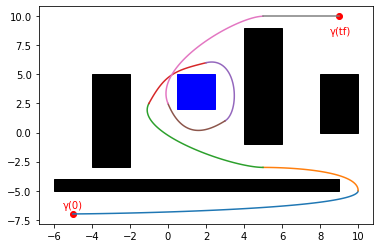

In [10]:
draw_environment()
theta_x, theta_y, dx, dy = piecewise2D(X,Y, Vx, Vy, T)
plt.show()

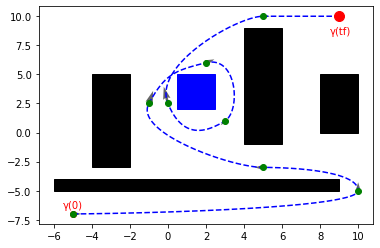

In [187]:
import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML

fig = plt.figure()
ax = plt.subplot(111)

def animate(t):
    ax.clear()
    
    rect1 = matplotlib.patches.Rectangle((4,-1), 2, 10, color='black')
    rect2 = matplotlib.patches.Rectangle((-6,-5), 15, 1, color='black')
    rect3 = matplotlib.patches.Rectangle((8,0), 2, 5, color='black')
    rect4 = matplotlib.patches.Rectangle((-4,-3), 2, 8, color='black')
    blue_rect = matplotlib.patches.Rectangle((0.5,2), 2, 3, color='blue')

    ax.add_patch(rect1)
    ax.add_patch(rect2)
    ax.add_patch(rect3)
    ax.add_patch(rect4)
    ax.add_patch(blue_rect)

    plt.plot(-5, -7, 'o', color='r')
    plt.plot(9, 10, 'o', color='r')
    plt.text(-5.5, -6.5,'γ(0)', color='r')
    plt.text(8.5, 8.5,'γ(tf)', color='r')
    
    # Path
    ax.plot(theta_x, theta_y, 'b--')
    
    # Initial conditions
    ax.plot(X,Y, 'go')
    ax.quiver(X,Y, Vx, Vy, color='0.4', scale=20)
        
    # Dynamic position
    ax.plot(theta_x[t], theta_y[t], 'ro', markersize=10)
       
    # Velocity vector
    ax.quiver([theta_x[t]], [theta_y[t]], [dx[t]], [dy[t]], color='r', units='xy', scale=10/np.linalg.norm([theta_x[t], theta_y[t]]))
    

anim = animation.FuncAnimation(fig, animate, frames=int(len(theta_x)/1), interval=25)


HTML(anim.to_jshtml())